# Food/Drink Image Classification Tool

Please do not run the entire Juypter Notebook before perusing the outputs for each code cell because the models used take a long time to train if using CPU.

This tool will attempt to classify images of 5 different foods and drink.

And finally assess its performance at prediciting a class of food images that it was not exposed to at  all during training.

# 1.&nbsp;Imports

## Upload Food/Drink Images Dataset

### Mount Google Drive

Uncomment/comment all text by selecting all and pressing `control + /`



In [ ]:
# from google.colab import drive
# drive.mount('/gdrive')
# %cd /gdrive

### Upload Files Directly

Uncomment/comment all text by selecting all and pressing `control + /`



Suitable for uploading files to Google's cloud and storing there TEMPORARILY without needing to mount Google Drive.

Warning: Files may be lost anytime after disconnecting from any Google runtime.

It took me x minutes to upload a x MB zipped dataset file.

In [1]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving image_dataset.zip to image_dataset.zip
User uploaded file "image_dataset.zip" with length 17393125 bytes


## Import Libraries/Modules

### Data Visualization

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

from PIL import Image
from IPython.display import SVG

print("Essential Data Visualization Libraries/Modules Loaded")

Essential Data Visualization Libraries/Modules Loaded


### Machine Learning

In [3]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.utils import model_to_dot

print("Essential Machine Learning Libraries/Modules Loaded")

Essential Machine Learning Libraries/Modules Loaded


In [4]:
# Check for CUDA GPU (TensorFlow)

if tf.config.list_physical_devices('GPU'):
    # Get the name of the first GPU device
    gpu_name = tf.config.list_physical_devices('GPU')[0].name
    print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
    print(f'Yes, there is a CUDA GPU: {gpu_name}')
    !nvidia-smi
    !nvcc --version
else:
    print('No, there is no CUDA GPU')

# Get the current device placement policy
print("\n Current Device Placement Policy:", tf.config.get_soft_device_placement())
#If the policy is set to True, TensorFlow will automatically try to place operations on available accelerators (like GPUs) when possible.
#If the policy is set to False, TensorFlow will raise an error if an operation cannot be placed on the requested device.

Num GPUs Available:  1
Yes, there is a CUDA GPU: /physical_device:GPU:0
Sun Mar 17 12:53:25 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/

In [5]:
# Maybe reduces overall memory usage on CUDA GPU...
if tf.config.experimental.list_physical_devices('GPU'):
    gpu = tf.config.experimental.list_physical_devices('GPU')[0]
    tf.config.experimental.set_memory_growth(gpu, True)
    print("Memory growth on GPU0 enabled")

Memory growth on GPU0 enabled


In [6]:
!pip show tensorflow

Name: tensorflow
Version: 2.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine-rl, tf_keras


# 2.&nbsp;Explorartory Data Analysis (EDA)

My image dataset directory structure is as follows. (After unzipping below)


There is a main parent folder (Food Drink Images Dataset).


Within this main parent folder there are 3 sub-folders corresponding to the type of data that the model will receive,

and they are namely Train, Validation and Test.


Finally within each of the 3 sub-folders contains the next layer of sub-folders for image classess/categories. And nested within each latter folder contains all the images that hopefully should belong in the labelled image class/category.


All the code below favors this type of well labelled directory structure

## Unzip image dataset

Importing a .zip file and then extracting it allows subfolders to be uploaded into the Colab environment

In [7]:
#extracts all image only files from zip file and displays their names
!unzip image_dataset.zip
#collapse this code cell if need be to hide the output below

Archive:  image_dataset.zip
   creating: Food Drink Images Dataset/Not Trained (Cabbage)/
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (1).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (10).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (2).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (3).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (4).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (5).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (6).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (7).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained (Cabbage) (8).jpg  
  inflating: Food Drink Images Dataset/Not Trained (Cabbage)/Not Trained

My image dataset directory structure is as follows

There is a main parent folder (Food Drink Images Dataset).

Within this main parent folder there are 3 sub-directories corresponding to the type of data that the model will receive, and they are namely Train, Validation and Test.

Finally within each of the 3 contains the final. And nested within the last folder contains all the images that hopefully should belong in the image class/category.

All the code below favors this type of well labelled directory structure

## Count Number of Image Files

In [8]:
import os
# Get the parent folder path
parent_folder = 'Food Drink Images Dataset'

# List all subfolders in the parent folder
subfolders = [f for f in os.listdir(parent_folder) if os.path.isdir(os.path.join(parent_folder, f))]

# Iterate through each subfolder
for subfolder in subfolders:
  # Get the subfolder path
  subfolder_path = os.path.join(parent_folder, subfolder)

  # Print the subfolder name
  print(f"First Subfolder: {subfolder}")

  # List all subfolders in the current subfolder
  subsubfolders = [f for f in os.listdir(subfolder_path) if os.path.isdir(os.path.join(subfolder_path, f))]

  # Iterate through each subsubfolder
  for subsubfolder in subsubfolders:
    # Get the subsubfolder path
    subsubfolder_path = os.path.join(subfolder_path, subsubfolder)

    # Print the number of files in the subsubfolder
    files = [f for f in os.listdir(subsubfolder_path) if os.path.isfile(os.path.join(subsubfolder_path, f))]
    print(f"  Second Subfolder: {subsubfolder}, Number of image files: {len(files)}")

First Subfolder: Not Trained (Cabbage)
First Subfolder: Train
  Second Subfolder: Hot Dog, Number of image files: 100
  Second Subfolder: Tea, Number of image files: 100
  Second Subfolder: Donut, Number of image files: 100
  Second Subfolder: Pizza, Number of image files: 100
  Second Subfolder: Fried Rice, Number of image files: 100
First Subfolder: Validation
  Second Subfolder: Hot Dog, Number of image files: 20
  Second Subfolder: Tea, Number of image files: 20
  Second Subfolder: Donut, Number of image files: 20
  Second Subfolder: Pizza, Number of image files: 20
  Second Subfolder: Fried Rice, Number of image files: 20
First Subfolder: Test
  Second Subfolder: Hot Dog, Number of image files: 10
  Second Subfolder: Tea, Number of image files: 10
  Second Subfolder: Donut, Number of image files: 10
  Second Subfolder: Pizza, Number of image files: 10
  Second Subfolder: Fried Rice, Number of image files: 10


There are no imbalanced classes and hence there is no need to plot a distribution of the entire dataset.

In [9]:
def count_all_files(parentfolder):
  """
  Counts all files within a parent folder and all its subfolders.

  Args:
    parentfolder: The parent folder to search.

  Returns:
    The total number of files found.
  """

  file_count = 0
  for root, _, files in os.walk(parentfolder):
    file_count += len(files)

  return file_count

# Example usage
parentfolder = "Food Drink Images Dataset"
total_files = count_all_files(parentfolder)

print(f"Total number of files: {total_files}")

Total number of files: 660


## View Sample Training Images

See some random training images from each image class.

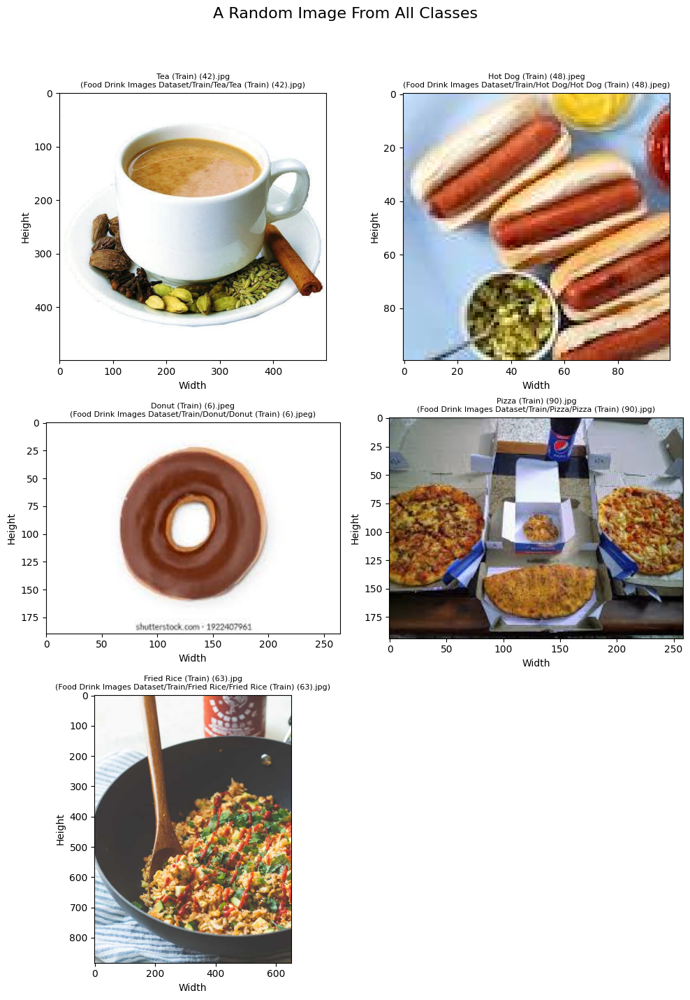

In [10]:
import os
import random

def open_random_image_collage(parent_folder):
    """
    Displays a collage of one randomly selected image from each of the deepest subfolders of a parent folder,
    shows them using matplotlib with the image name and path as subtitles, and adds a general title for the collage.

    Args:
      parent_folder: The path to the parent folder.
    """
    deepest_subfolders = []
    for root, dirs, files in os.walk(parent_folder):
        if not dirs:
            deepest_subfolders.append(root)

    # Preparing to display all selected images in a collage
    selected_images = []
    for subfolder in random.sample(deepest_subfolders, len(deepest_subfolders)):
        image_files = [f for f in os.listdir(subfolder) if f.endswith(('.jpg', '.png', '.jpeg'))]
        if image_files:
            image_path = os.path.join(subfolder, random.choice(image_files))
            selected_images.append(image_path)

    if not selected_images:
        print("No images found.")
        return

    # Calculate grid size for subplots
    num_images = len(selected_images)
    cols = 2  # change number of columns
    rows = num_images // cols + (num_images % cols > 0)

    fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    fig.suptitle("A Random Image From All Classes", fontsize=16)

    if rows * cols > 1:
        axs = axs.flatten()
    else:
        axs = [axs]

    for ax, image_path in zip(axs, selected_images):
        img = Image.open(image_path)
        ax.imshow(img)
        ax.axis('on')  # Show axes for individual images
        ax.set_xlabel('Width')
        ax.set_ylabel('Height')
        title = os.path.basename(image_path)
        subtitle = f"({image_path})"
        ax.set_title(f"{title}\n{subtitle}", fontsize=8)

    # Hide any unused subplots
    for i in range(num_images, len(axs)):
        axs[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Example usage
parent_folder = "Food Drink Images Dataset/Train"
open_random_image_collage(parent_folder)

# 3.&nbsp;Images Preprocessing

## Preview Data Augmentation

Preview images data augmentation with an example donut picture located in the training dataset

In [50]:
!mkdir preview_augment/
#!mkdir preview_augment\ #Windows forward slash for making directory

# augmentation configuration for training

train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=40,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# train_datagen = ImageDataGenerator(
#         rotation_range=30,
#         width_shift_range=0.2,
#         height_shift_range=0.2,
#         shear_range=0.2,
#         zoom_range=0.2,
#         horizontal_flip=True,
#         fill_mode='nearest')

#change the following 3 lines accordingly
img_class = 'Donut'
img_name = 'Donut (Train) (69).jpeg'
img_path = 'Food Drink Images Dataset/Train/Donut/Donut (Train) (69).jpeg'

img = load_img(img_path)
x = img_to_array(img)  #Numpy array with shape
x = x.reshape((1,) + x.shape)

# the .flow() command below generates batches of randomly transformed images
# and saves the results to the `preview_augment/` directory
i = 0
for batch in train_datagen.flow(x, batch_size=1,
                          save_to_dir='preview_augment', save_prefix='Donut Augment', save_format='jpeg'):
    i += 1
    if i > 20:
        break  # otherwise the generator would loop indefinitely

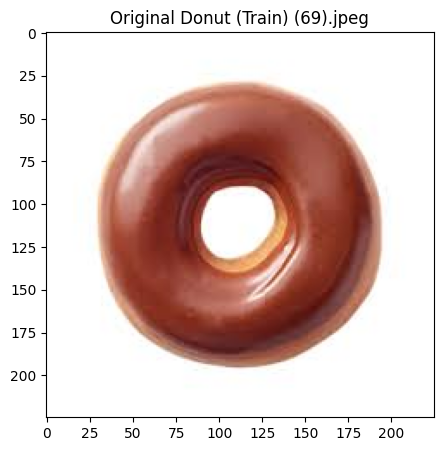

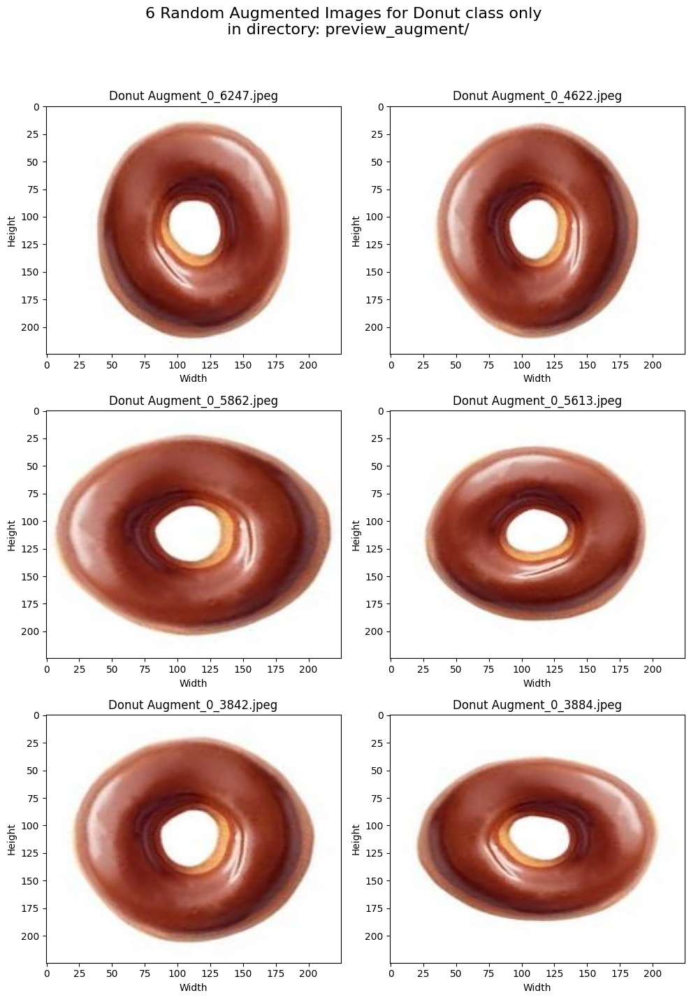

In [51]:
# Display the original image with caption
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
img = plt.imread('Food Drink Images Dataset/Train/Donut/Donut (Train) (69).jpeg')
ax.imshow(img, aspect='auto')  # Adjust aspect ratio based on the image's size
ax.set_title("Original " + img_name)
plt.show()

# Prepare to display augmented images
directory = 'preview_augment/'
files = os.listdir(directory)
selected_files = random.sample(files, 6)

# Calculate grid size for subplots
rows = len(selected_files) // 2 + len(selected_files) % 2
cols = 2 if len(selected_files) > 1 else 1

fig, axs = plt.subplots(rows, cols, figsize=(10, rows * 5))
fig.suptitle(f'6 Random Augmented Images for {img_class} class only \n in directory: preview_augment/', fontsize=16)  # Title for the entire collage

# If only one image is selected
if len(selected_files) == 1:
    axs = [axs]

# Flatten the axs array for easier iteration
axs = axs.flatten()

for i, file in enumerate(selected_files):
    file_path = os.path.join(directory, file)
    img = plt.imread(file_path)
    axs[i].imshow(img, aspect='auto')  # Let each subplot adjust to its image's aspect ratio
    axs[i].set_title(file)

    # Adding axes labels
    axs[i].set_xlabel('Width')
    axs[i].set_ylabel('Height')

# Hide the empty subplots if any
for j in range(i + 1, len(axs)):
    axs[j].set_visible(False)  # This completely hides the subplot, including the frame

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title
plt.show()


## Augmentation & Normalization

In [52]:
BATCH_SIZE = 32
IMAGE_SIZE = 150


# augmentation configuration for validation:
# only rescaling
validation_datagen = ImageDataGenerator(rescale=1./255)

# augmentation configuration for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        'Food Drink Images Dataset/Train/',  # target directory
        target_size=(IMAGE_SIZE, IMAGE_SIZE),  # all images will be resized to 150x150
        batch_size=BATCH_SIZE,
        class_mode='categorical')

# this is a similar generator, for validation data
validation_generator = validation_datagen.flow_from_directory(
        'Food Drink Images Dataset/Validation/',
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False)

# this is a similar generator, for test data
test_generator = test_datagen.flow_from_directory(
        'Food Drink Images Dataset/Test/',
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False)

Found 500 images belonging to 5 classes.
Found 100 images belonging to 5 classes.
Found 50 images belonging to 5 classes.


In [53]:
#print classes indices
indices_train = train_generator.class_indices
print("Train:" , indices_train)

indices_valid = validation_generator.class_indices
print("Validation:" , indices_valid)

indices_test = test_generator.class_indices
print("Test:" , indices_test)

Train: {'Donut': 0, 'Fried Rice': 1, 'Hot Dog': 2, 'Pizza': 3, 'Tea': 4}
Validation: {'Donut': 0, 'Fried Rice': 1, 'Hot Dog': 2, 'Pizza': 3, 'Tea': 4}
Test: {'Donut': 0, 'Fried Rice': 1, 'Hot Dog': 2, 'Pizza': 3, 'Tea': 4}


# 4.&nbsp;Custom CNN Model

In [126]:
tf.keras.backend.clear_session()  # clear TensorFlow internal graph (backend) but does not delete trained model stored as a Python object
                                  # to allow a new model to be trained or retrain an old model

model_CNN = Sequential()

# Input layer
model_CNN.add(Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))

# CNN - Convolutional Neural Network Layers
model_CNN.add(Conv2D(16, (3, 3), activation="relu", padding="same"))
model_CNN.add(BatchNormalization())  # Batch normalization layer added
model_CNN.add(MaxPooling2D(pool_size=(2, 2)))
model_CNN.add(Flatten())

# Fully Connected Layers
model_CNN.add(Dense(200, activation="relu"))
model_CNN.add(Dropout(0.5))
model_CNN.add(Dense(5, activation="softmax"))  # Output layer with 5 classes
#softmax for probability distribution in predicting test images

opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model_CNN.compile(optimizer=opt, loss="categorical_crossentropy", metrics=['accuracy'])

model_CNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 16)      4624      
                                                                 
 batch_normalization (Batch  (None, 150, 150, 16)      64        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 75, 75, 16)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 90000)             0         
                                                                 
 dense (Dense)               (None, 200)               1

## Visualize CNN Model

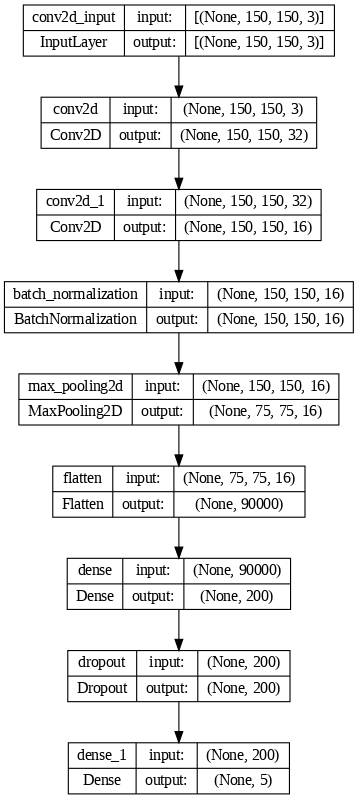

In [90]:
#display(SVG(model_to_dot(model_CNN, show_shapes=True,dpi=80).create(prog='dot', format='svg')))
#adjust dpi for different notebook environments

from IPython.display import Image, display
import pydot
import io

# Generate the model graph
graph = model_to_dot(model_CNN, show_shapes=True, dpi=80)
png_data = graph.create(prog='dot', format='png')

# Use BytesIO to handle the binary data and create an Image to display it
image_io = io.BytesIO(png_data)
image = Image(image_io.read())

display(image)

In [91]:
!pip install visualkeras
# https://github.com/paulgavrikov/visualkeras
# compatible with pillow versions <=9.50 only

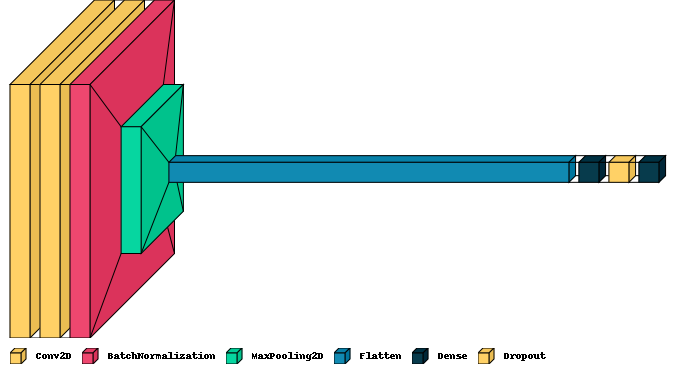

In [127]:
import visualkeras
# follows model.summary()
visualkeras.layered_view(model_CNN, legend=True,scale_xy=1.69)

## ** Begin CNN Training **

NOTE: trainnig time with CUDA GPU (NVIDIA RTX 3070Ti Laptop GPU on local runtime) is around 2 minutes. And about 3-4 minutes on Google Colab's T4 GPU.


In [93]:
# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss',  # Monitor validation loss
                               patience=15,  # Number of epochs with no improvement after which training will be stopped
                               #min_delta=0.1,  # Minimum change in the monitored quantity to qualify as an improvement
                               mode='min',  # In 'min' mode, training will stop when the quantity monitored has stopped decreasing
                               verbose=1)

In [94]:
history_CNN = model_CNN.fit(train_generator,validation_data=validation_generator, epochs=69,callbacks=[early_stopping])

Epoch 1/69
16/16 [==============================] - 8s 381ms/step - loss: 6.6783 - accuracy: 0.3860 - val_loss: 1.9226 - val_accuracy: 0.2000
Epoch 2/69
16/16 [==============================] - 10s 614ms/step - loss: 1.5295 - accuracy: 0.3240 - val_loss: 2.4647 - val_accuracy: 0.2000
Epoch 3/69
16/16 [==============================] - 11s 681ms/step - loss: 1.3494 - accuracy: 0.4080 - val_loss: 2.0119 - val_accuracy: 0.2000
Epoch 4/69
16/16 [==============================] - 5s 288ms/step - loss: 1.1899 - accuracy: 0.4680 - val_loss: 1.9898 - val_accuracy: 0.2000
Epoch 5/69
16/16 [==============================] - 4s 234ms/step - loss: 1.0891 - accuracy: 0.5360 - val_loss: 2.2472 - val_accuracy: 0.2000
Epoch 6/69
16/16 [==============================] - 4s 224ms/step - loss: 1.0178 - accuracy: 0.5660 - val_loss: 2.2203 - val_accuracy: 0.2000
Epoch 7/69
16/16 [==============================] - 4s 282ms/step - loss: 1.0491 - accuracy: 0.5520 - val_loss: 1.7239 - val_accuracy: 0.2100
Epoc

In [95]:
# See the location of the model variables in memory (GPU or CPU)
print("Model Variable Location:")
for var in model_CNN.variables:
    print(var.device)

Model Variable Location:
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0


## CNN Loss and Accuracy Graphs

In [96]:
def plot_curves(history):
  plt.figure()
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.legend(['Training', 'Validation'], loc='upper right')
  plt.title("Training and Validation Loss")

  plt.figure()
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.legend(['Training', 'Validation'], loc='lower right')
  plt.title('Training and Validation Accuracy')

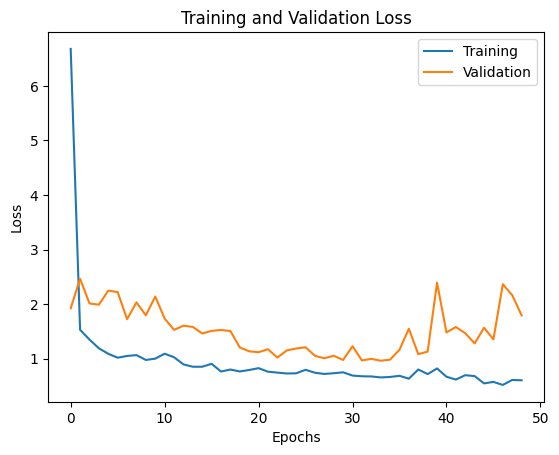

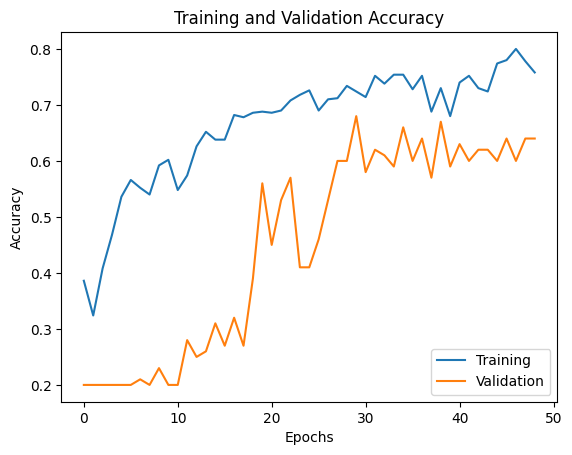

In [97]:
plot_curves(history_CNN.history)

## Evaluate CNN Model

Evaluate the finished training CNN model to see overall loss and accuracy on the entire training and validation datasets.

In [98]:
scores_train = model_CNN.evaluate(train_generator)
print('CNN Model Training Overall Loss    :', scores_train[0])
print('CNN Model Training Overall Accuracy:', scores_train[1])
print()

scores_val = model_CNN.evaluate(validation_generator)
print('CNN Model Validation Overall Loss    :', scores_val[0])
print('CNN Model Validation Overall Accuracy:', scores_val[1])

16/16 [==============================] - 3s 202ms/step - loss: 0.4108 - accuracy: 0.8620
CNN Model Training Overall Loss    : 0.4108273386955261
CNN Model Training Overall Accuracy: 0.8619999885559082

4/4 [==============================] - 1s 256ms/step - loss: 1.7933 - accuracy: 0.6400
CNN Model Validation Overall Loss    : 1.793308973312378
CNN Model Validation Overall Accuracy: 0.6399999856948853


### Test CNN Predictions

Lets see the predicted image classess on the unseen test data using the custom CNN model.

In [99]:
def predict(directory, model):
    test_images = []
    for image_name in os.listdir(directory):
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(directory, image_name)
            img = load_img(path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
            x = img_to_array(img)
            x = x * (1./255)
            x = np.expand_dims(x, axis=0)
            prediction = model.predict(x)
            test_images.append((img, prediction, image_name, path))
    return test_images

def plot_collage(test_images, test_class, model_name):
    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(10, 5 * rows))
    title = f"Image Collage For {test_class} ({model_name})"
    fig.suptitle(title, fontsize=16)

    for ax, (img, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        max_index = np.argmax(prediction[0])
        predicted_class = list(indices_test.keys())[max_index]
        max_probability = np.around(prediction[0][max_index], decimals=2) * 100
        title_text = f'*** Predicted: {predicted_class} ({max_probability:.2f}%) ***\n{image_name}\n{file_path}'
        ax.imshow(img)
        ax.set_title(title_text, fontsize=8)
        ax.axis('off')

    # Hide unused axes
    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def plot_bargraphs(test_images, test_class, model_name):
    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(10, 5 * rows))
    title = f"Prediction Probability Bar Graphs For {test_class} ({model_name})"
    fig.suptitle(title, fontsize=16)

    for ax, (_, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        classes = list(indices_test.keys())
        probabilities = np.around(prediction, decimals=2).flatten() * 100
        ax.bar(classes, probabilities)
        # Set the locations for the x-ticks
        ax.set_xticks(range(len(classes)))

        # Now set the labels for the ticks with the correct classes, along with other properties
        ax.set_xticklabels(classes, rotation=90, fontsize=8)

        ax.set_ylabel('Probability (%)')
        title_text = f'{image_name}\n{file_path}'  # Include file path in title
        ax.set_title(title_text, fontsize=8)

    # Hide unused axes
    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

from matplotlib import colormaps

def plot_piecharts(test_images, test_class, model_name, colormap_name='Dark2_r'):
    classes = list(indices_test.keys())  # Assuming indices_test is defined elsewhere
    colormap = colormaps[colormap_name]  # Use matplotlib.colormaps to access the colormap
    class_colors = {cls: colormap(i / len(classes)) for i, cls in enumerate(classes)}

    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(20, 10 * rows))
    title = f"Prediction Probability Pie Charts For {test_class} ({model_name})\n [look for standardized color of {test_class} for all pie charts]"
    fig.suptitle(title, fontsize=16)

    for ax, (_, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        probabilities = np.around(prediction, decimals=2).flatten()
        probabilities = probabilities / np.sum(probabilities)

        # Apply filtering for significant probabilities if necessary
        significant_indices = probabilities > 0.01
        significant_probs = probabilities[significant_indices]
        significant_classes = np.array(classes)[significant_indices]

        # Assign colors to significant classes
        colors = [class_colors[cls] for cls in significant_classes]

        wedges, texts, autotexts = ax.pie(significant_probs, colors=colors, autopct='%1.1f%%', startangle=140, textprops=dict(color="w"))

        # Generate custom legends with consistent class colors
        ax.legend(wedges, significant_classes, title="Classes", loc="center left", bbox_to_anchor=(1, 0.5))
        ax.axis('equal')
        title_text = f'{image_name}\n{file_path}'
        ax.set_title(title_text, fontsize=8)

    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

1/1 [==============================] - 0s 72ms/step


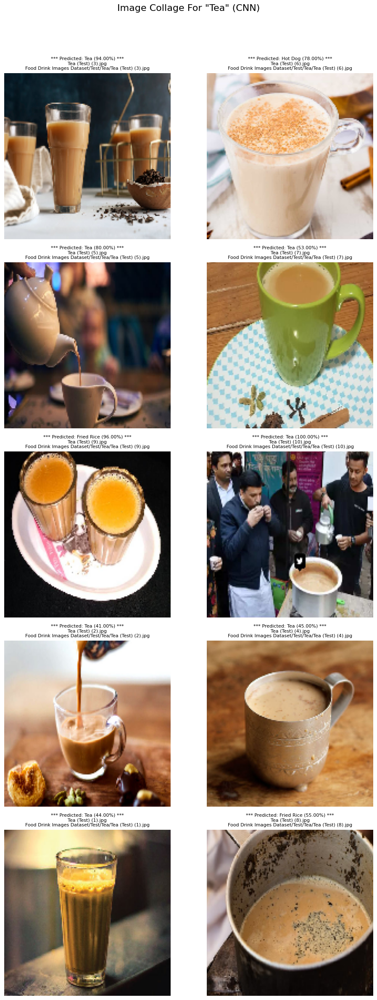

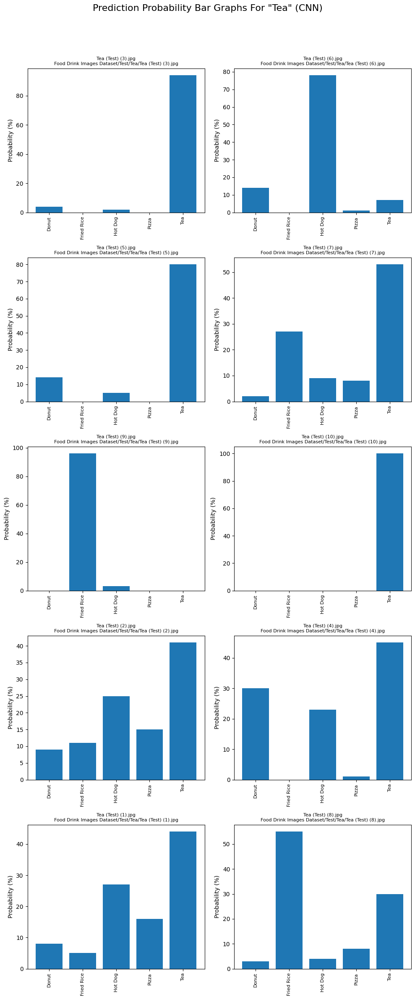

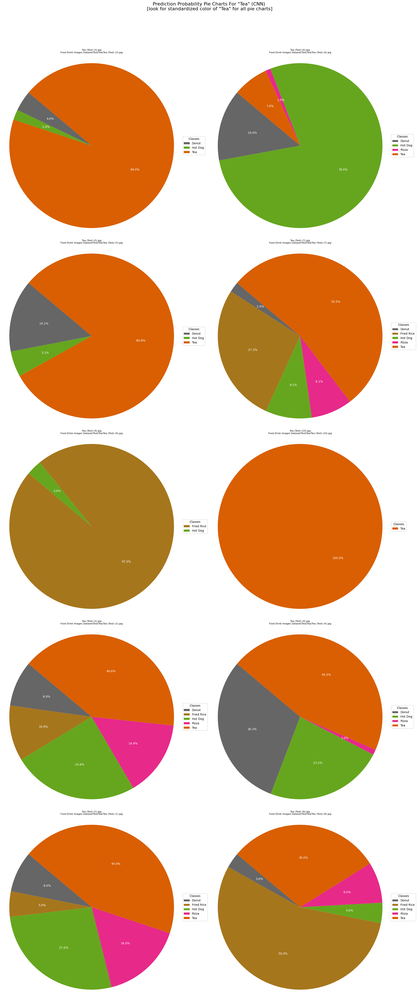

In [100]:
model_name = "CNN"
test_class = '"Tea"' # change image test class accordingly
test_images = predict('Food Drink Images Dataset/Test/Tea', model_CNN) # change directory path accordingly
plot_collage(test_images, test_class, model_name)
plot_bargraphs(test_images, test_class, model_name)
plot_piecharts(test_images, test_class, model_name)

#5.&nbsp;Pre-trained Model

NOTE: Training time using a CUDA GPU is around x minutes

The VGG16 pretrained model for image classification from TensorFlow is used

In [101]:
from tensorflow.keras.applications import VGG16
vgg16_base = VGG16(weights='imagenet',    # use weights from ImageNet
                 include_top=False,     # remove classification layers trained on ImageNet
                 input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
print(vgg16_base.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [102]:
tf.keras.backend.clear_session() #clear TensorFlow backend only
for layer in vgg16_base.layers:
    layer.trainable = False

model_VGG16 = Sequential([
        # vgg16_base added as the main layers
        vgg16_base,
        # custom prediction layers (fine tune final layers of VGG16 model)
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dense(5, activation='softmax')
    ])

model_VGG16.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

model_VGG16.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 512)               4194816   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 5)                 1285      
                                                                 
Total params: 19042117 (72.64 MB)
Trainable params: 4327

## Visualize VGG16 Model

Both the VGG16 base and VGG16 fine tuned layers are printed in the output below.

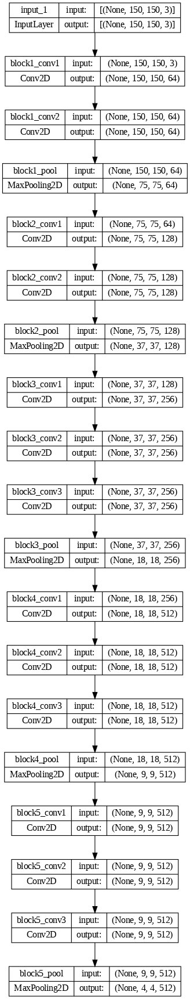

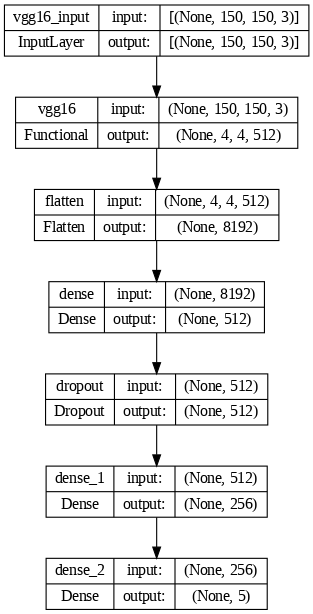

In [103]:
#display(SVG(model_to_dot(vgg16_base, show_shapes=True,dpi=80).create(prog='dot', format='svg')))
#display(SVG(model_to_dot(model_VGG16, show_shapes=True,dpi=80).create(prog='dot', format='svg')))
#adjust dpi for different notebook environments

from IPython.display import Image, display
import pydot
import io

# Generate the model graph
graph = model_to_dot(vgg16_base, show_shapes=True, dpi=80)
png_data = graph.create(prog='dot', format='png')

# Use BytesIO to handle the binary data and create an Image to display it
image_io = io.BytesIO(png_data)
image = Image(image_io.read())

display(image)
print()
print()

# Generate the model graph
graph2 = model_to_dot(model_VGG16, show_shapes=True, dpi=80)
png_data2 = graph2.create(prog='dot', format='png')

# Use BytesIO to handle the binary data and create an Image to display it
image_io2 = io.BytesIO(png_data2)
image2 = Image(image_io2.read())

display(image2)

In [104]:
!pip install visualkeras
# https://github.com/paulgavrikov/visualkeras
# compatible with pillow versions <=9.50 only

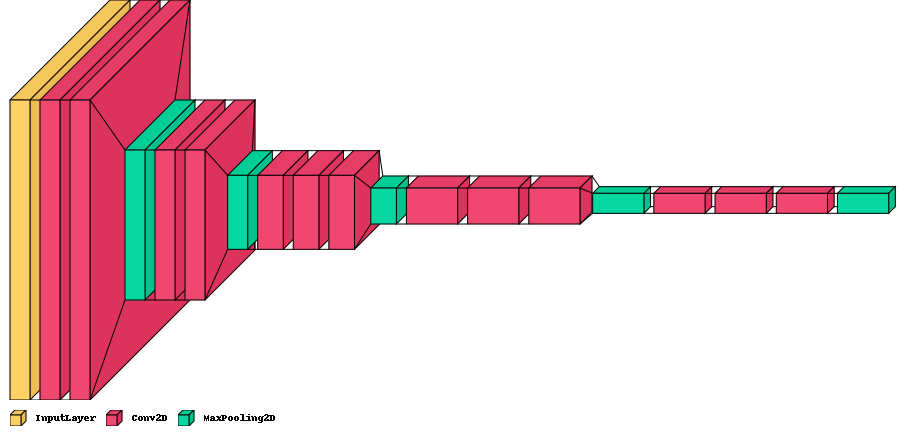

In [105]:
import visualkeras
# follows model.summary()
visualkeras.layered_view(vgg16_base, legend=True,scale_xy=2)

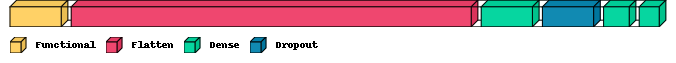

In [106]:
# follows model.summary()
visualkeras.layered_view(model_VGG16, legend=True,scale_xy=2)

## ** Begin VGG16 Training **

NOTE: trainnig time with CUDA GPU (NVIDIA RTX 3070Ti Laptop GPU on local runtime) is around 2 minutes. And about 2-3 minutes on Google Colab's T4 GPU.


In [107]:
# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss',  # Monitor validation loss
                               patience=10,  # Number of epochs with no improvement after which training will be stopped
                               #min_delta=0.1,  # Minimum change in the monitored quantity to qualify as an improvement
                               mode='min',  # In 'min' mode, training will stop when the quantity monitored has stopped decreasing
                               verbose=1)

In [108]:
#training
history_vgg16 = model_VGG16.fit(train_generator,validation_data=validation_generator, epochs=69, callbacks=[early_stopping])

Epoch 1/69
16/16 [==============================] - 8s 354ms/step - loss: 1.7718 - accuracy: 0.4220 - val_loss: 0.7697 - val_accuracy: 0.6800
Epoch 2/69
16/16 [==============================] - 10s 580ms/step - loss: 0.8599 - accuracy: 0.6880 - val_loss: 0.6114 - val_accuracy: 0.7700
Epoch 3/69
16/16 [==============================] - 6s 398ms/step - loss: 0.6220 - accuracy: 0.7280 - val_loss: 0.4464 - val_accuracy: 0.8300
Epoch 4/69
16/16 [==============================] - 4s 245ms/step - loss: 0.4354 - accuracy: 0.8420 - val_loss: 0.4554 - val_accuracy: 0.8400
Epoch 5/69
16/16 [==============================] - 4s 255ms/step - loss: 0.3560 - accuracy: 0.8580 - val_loss: 0.4490 - val_accuracy: 0.8600
Epoch 6/69
16/16 [==============================] - 4s 249ms/step - loss: 0.4209 - accuracy: 0.8440 - val_loss: 0.4717 - val_accuracy: 0.8300
Epoch 7/69
16/16 [==============================] - 4s 248ms/step - loss: 0.3190 - accuracy: 0.8960 - val_loss: 0.4721 - val_accuracy: 0.8700
Epoch

In [109]:
# See the location of the model variables in memory (GPU or CPU)
print("Model Variable Location:")
for var in model_VGG16.variables:
    print(var.device)

Model Variable Location:
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:0/device:GPU:0
/job:localhost/replica:0/task:

## VGG16 Loss and Accuracy Graphs

In [110]:
def plot_curves(history):
  plt.figure()
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.legend(['Training', 'Validation'], loc='upper right')
  plt.title("Training and Validation Loss")

  plt.figure()
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.legend(['Training', 'Validation'], loc='lower right')
  plt.title('Training and Validation Accuracy')

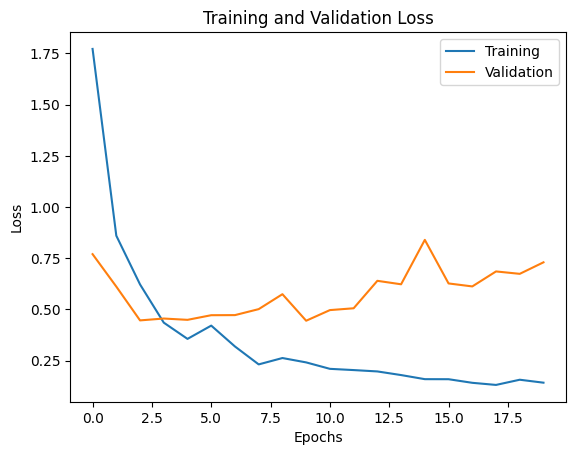

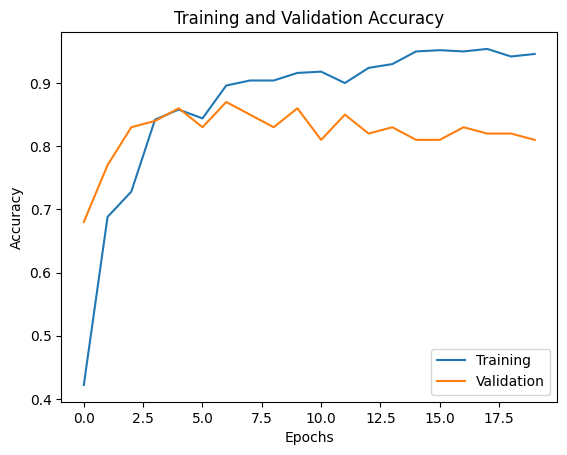

In [111]:
plot_curves(history_vgg16.history)

## Evaluate VGG16 Model

Evaluate the VGG16 model loss and accuracy on the entire training and validation datasets.

In [112]:
scores_train = model_VGG16.evaluate(train_generator)
print('VGG16 Model Overall Training Loss    :', scores_train[0])
print('VGG16 Model Overall Training Accuracy:', scores_train[1])
print()

scores_val = model_VGG16.evaluate(validation_generator)
print('VGG16 Model Overall Validation Loss    :', scores_val[0])
print('VGG16 Model Overall Validation Accuracy:', scores_val[1])

16/16 [==============================] - 5s 313ms/step - loss: 0.0547 - accuracy: 0.9820
VGG16 Model Overall Training Loss    : 0.05466940999031067
VGG16 Model Overall Training Accuracy: 0.9819999933242798

4/4 [==============================] - 1s 122ms/step - loss: 0.7299 - accuracy: 0.8100
VGG16 Model Overall Validation Loss    : 0.7298895120620728
VGG16 Model Overall Validation Accuracy: 0.8100000023841858


### Test VGG16 Predictions

Lets see the predicted image classess on the unseen test data using the custom CNN model.

In [113]:
def predict(directory, model):
    test_images = []
    for image_name in os.listdir(directory):
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(directory, image_name)
            img = load_img(path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
            x = img_to_array(img)
            x = x * (1./255)
            x = np.expand_dims(x, axis=0)
            prediction = model.predict(x)
            test_images.append((img, prediction, image_name, path))
    return test_images

def plot_collage(test_images, test_class, model_name):
    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(10, 5 * rows))
    title = f"Image Collage For {test_class} ({model_name})"
    fig.suptitle(title, fontsize=16)

    for ax, (img, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        max_index = np.argmax(prediction[0])
        predicted_class = list(indices_test.keys())[max_index]
        max_probability = np.around(prediction[0][max_index], decimals=2) * 100
        title_text = f'*** Predicted: {predicted_class} ({max_probability:.2f}%) ***\n{image_name}\n{file_path}'
        ax.imshow(img)
        ax.set_title(title_text, fontsize=8)
        ax.axis('off')

    # Hide unused axes
    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def plot_bargraphs(test_images, test_class, model_name):
    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(10, 5 * rows))
    title = f"Prediction Probability Bar Graphs For {test_class} ({model_name})"
    fig.suptitle(title, fontsize=16)

    for ax, (_, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        classes = list(indices_test.keys())
        probabilities = np.around(prediction, decimals=2).flatten() * 100
        ax.bar(classes, probabilities)
        # Set the locations for the x-ticks
        ax.set_xticks(range(len(classes)))

        # Now set the labels for the ticks with the correct classes, along with other properties
        ax.set_xticklabels(classes, rotation=90, fontsize=8)

        ax.set_ylabel('Probability (%)')
        title_text = f'{image_name}\n{file_path}'
        ax.set_title(title_text, fontsize=8)

    # Hide unused axes
    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

from matplotlib import colormaps

def plot_piecharts(test_images, test_class, model_name, colormap_name='Dark2_r'): # change last argument for different Matplotlib colormaps
    classes = list(indices_test.keys())
    colormap = colormaps[colormap_name]  # Use matplotlib.colormaps to access the colormap
    class_colors = {cls: colormap(i / len(classes)) for i, cls in enumerate(classes)}

    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(20, 10 * rows))
    title = f"Prediction Probability Pie Charts For {test_class} ({model_name})\n [look for standardized color of {test_class} for all pie charts]"
    fig.suptitle(title, fontsize=16)

    for ax, (_, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        probabilities = np.around(prediction, decimals=2).flatten()
        probabilities = probabilities / np.sum(probabilities)

        # Apply filtering for significant probabilities if necessary
        significant_indices = probabilities > 0.01
        significant_probs = probabilities[significant_indices]
        significant_classes = np.array(classes)[significant_indices]

        # Assign colors to significant classes
        colors = [class_colors[cls] for cls in significant_classes]

        wedges, texts, autotexts = ax.pie(significant_probs, colors=colors, autopct='%1.1f%%', startangle=140, textprops=dict(color="w"))

        # Generate custom legends with consistent class colors
        ax.legend(wedges, significant_classes, title="Classes", loc="center left", bbox_to_anchor=(1, 0.5))
        ax.axis('equal')
        title_text = f'{image_name}\n{file_path}'
        ax.set_title(title_text, fontsize=8)

    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

1/1 [==============================] - 0s 26ms/step


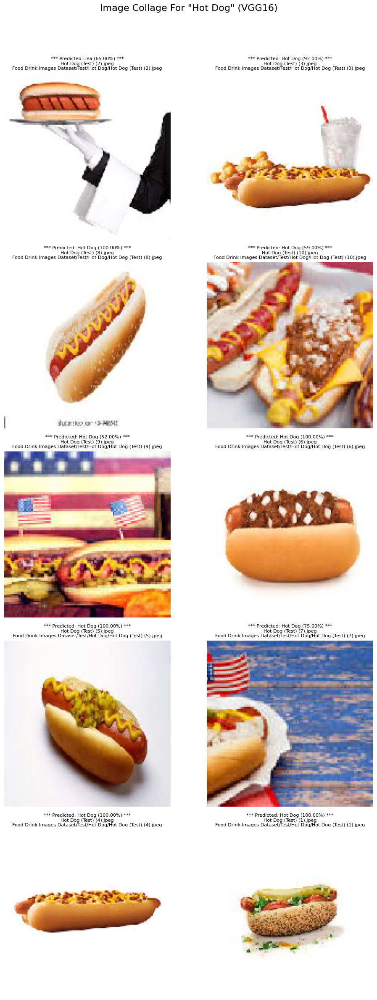

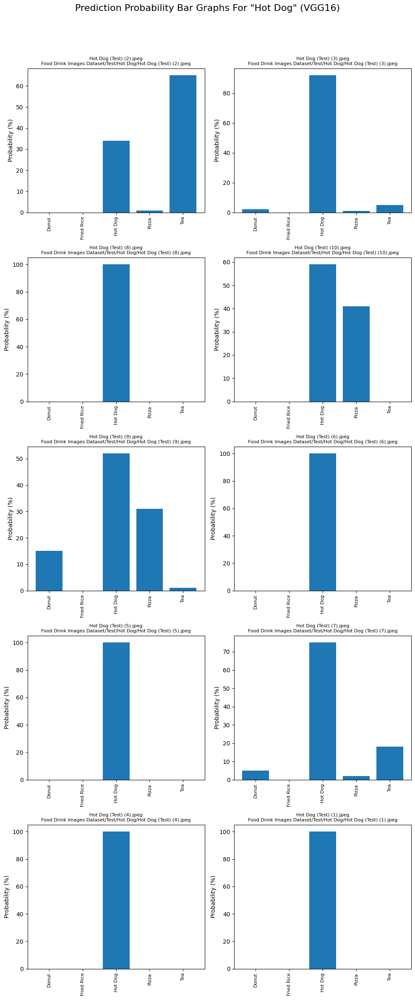

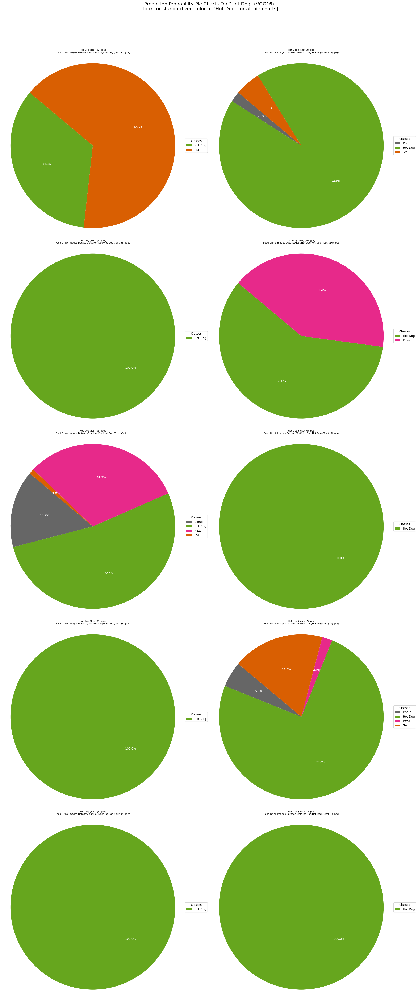

In [114]:
model_name = "VGG16"
test_class = '"Hot Dog"' # change image test class accordingly
test_images = predict('Food Drink Images Dataset/Test/Hot Dog', model_VGG16) # change directory path accordingly
plot_collage(test_images, test_class, model_name)
plot_bargraphs(test_images, test_class, model_name)
plot_piecharts(test_images, test_class, model_name)

# 6.&nbsp;Comparison of Models

## Evaluation (Test Scores)

Evaluating the models overall performance on the unseen test data during training.


NOTE: The `test_generator` dataset object (keras.preprocessing.image.DirectoryIterator object) has never been exposed to the models during training.

However do keep in mind that all the test images are located in labelled folders and not all jumbled together in a main test folder. The rationale is for easy tracking and neat arrangement.     

In [115]:
scores_test = model_CNN.evaluate(test_generator)
print('CNN Model Overal Test Loss    :', scores_test[0])
print('CNN Model Overal Test Accuracy:', scores_test[1])
print()

scores_test = model_VGG16.evaluate(test_generator)
print('VGG16 Model Overall Test Loss    :', scores_test[0])
print('VGG16 Model Overall Test Accuracy:', scores_test[1])

2/2 [==============================] - 1s 325ms/step - loss: 0.9468 - accuracy: 0.7600
CNN Model Overal Test Loss    : 0.9468377828598022
CNN Model Overal Test Accuracy: 0.7599999904632568

2/2 [==============================] - 0s 177ms/step - loss: 0.4768 - accuracy: 0.8400
VGG16 Model Overall Test Loss    : 0.47676363587379456
VGG16 Model Overall Test Accuracy: 0.8399999737739563


## Confusion Matrix

In [116]:
from sklearn.metrics import confusion_matrix

def generate_confusion_matrices(parent_test_folder, class_names, model, model_name):
    # Collect Predictions and True Labels
    predictions = []
    true_labels = []

    for class_index, class_name in enumerate(class_names):
        class_folder = os.path.join(parent_test_folder, class_name)
        for image_file in os.listdir(class_folder):
            image_path = os.path.join(class_folder, image_file)

            # Image Loading and Preprocessing
            img = load_img(image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
            x = img_to_array(img)
            x = x * (1./255)
            x = np.expand_dims(x, axis=0)

            # Get prediction from your model
            prediction = model.predict(x)[0]
            predicted_class_index = np.argmax(prediction)

            predictions.append(predicted_class_index)
            true_labels.append(class_index)

    # Construct Confusion Matrices
    cm = confusion_matrix(true_labels, predictions)  # Raw counts
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # For percentages

    # Confusion Matrix 1: Percentages
    plt.figure(figsize=(8,6))
    cmap = plt.cm.Greens
    percentage_cm = 100 * cm_normalized
    labels = [['{0:.1f}%'.format(value) for value in row] for row in percentage_cm]
    sb.heatmap(percentage_cm, annot=labels, fmt='', cmap=cmap,
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label (Reference)')
    title_text = f'Confusion Matrix of {model_name} model (Percentages)'
    plt.title(title_text)
    plt.show()

    # Confusion Matrix 2: Raw Counts
    plt.figure(figsize=(8,6))
    cmap = plt.cm.Blues  # Different colormap for distinction
    sb.heatmap(cm, annot=True, fmt='d', cmap=cmap,  # 'd' format for integers
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label (Reference)')
    title_text = f'Confusion Matrix of {model_name} model (Raw Counts)'
    plt.title(title_text)
    plt.show()

### CNN Model

1/1 [==============================] - 0s 17ms/step


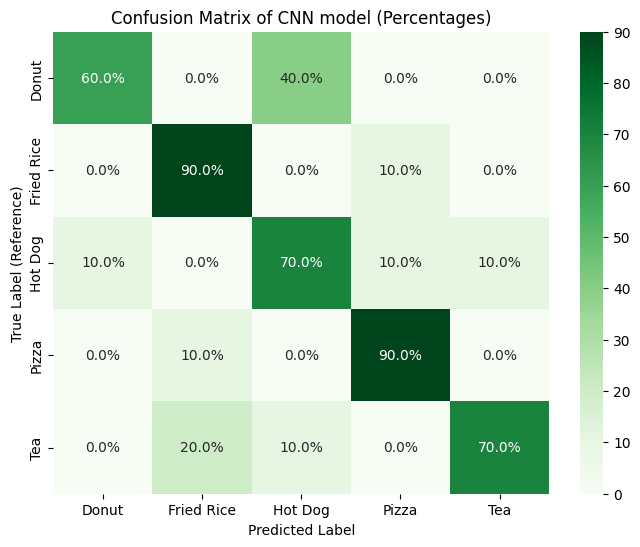

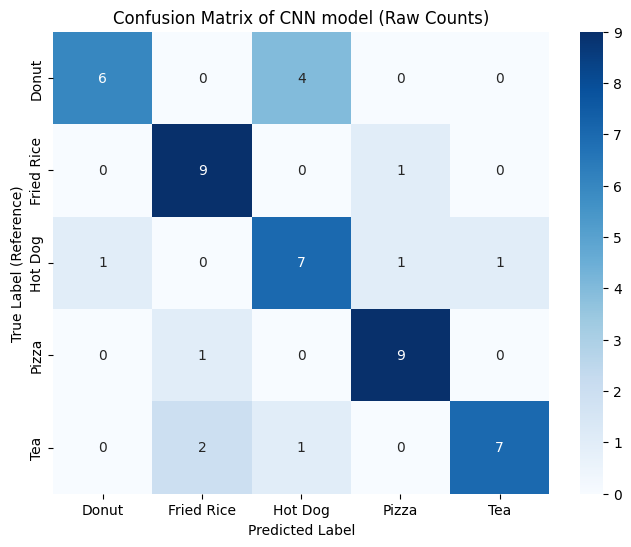

In [117]:
parent_test_folder="Food Drink Images Dataset/Test"
class_names=['Donut', 'Fried Rice', 'Hot Dog', 'Pizza', 'Tea']
model_name = "CNN"
model = model_CNN
generate_confusion_matrices(parent_test_folder,
                            class_names,
                            model, model_name)

### VGG16 Model

1/1 [==============================] - 0s 19ms/step


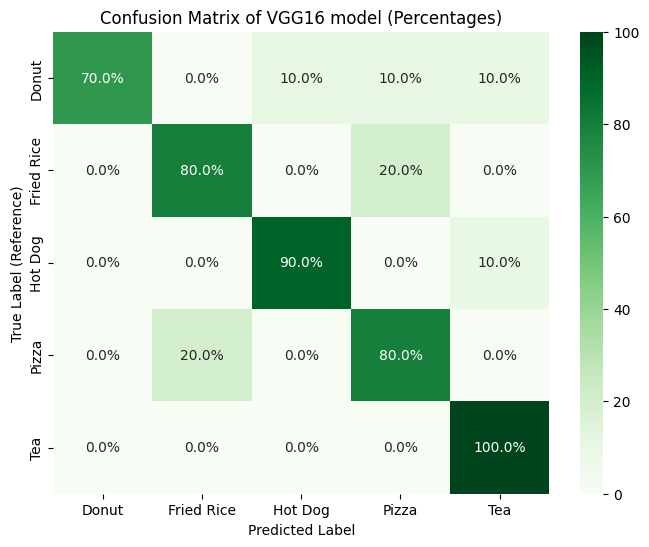

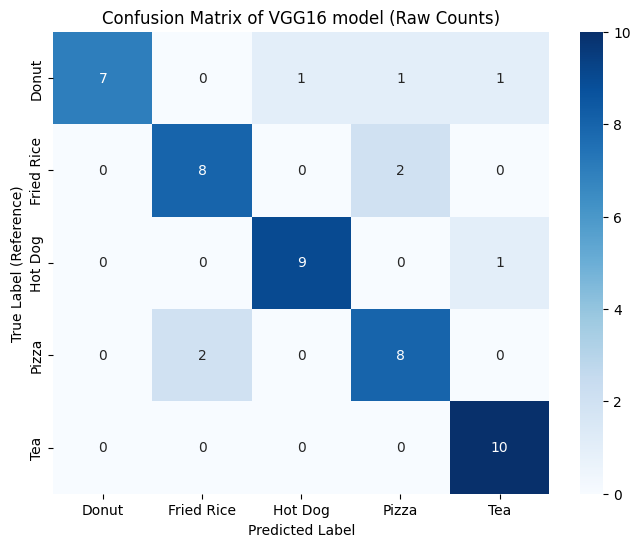

In [118]:
parent_test_folder="Food Drink Images Dataset/Test"
class_names=['Donut', 'Fried Rice', 'Hot Dog', 'Pizza', 'Tea']
model_name = "VGG16"
model = model_VGG16
generate_confusion_matrices(parent_test_folder,
                            class_names,
                            model, model_name)

# 7.&nbsp; OTHER (Not Trained) Image Class

Now, lets test the models prediction on an image class that it was never trained on (OTHER) and that would namely be Cabbages which is still related to food, but irrelevant to Donut, Fried Rice, Hot Dog, Pizza and Tea.

None of the images belonging to the not trained image class were ever exposed to the models during training.

In [119]:
def predict_notrain(directory, model):
    test_images = []
    for image_name in os.listdir(directory):
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(directory, image_name)
            img = load_img(path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
            x = img_to_array(img)
            x = x * (1./255)
            x = np.expand_dims(x, axis=0)
            prediction = model.predict(x)
            test_images.append((img, prediction, image_name, path))
    return test_images

def plot_notrain_collage(test_images, test_class, model_name):
    rows = len(test_images) // 2 + (len(test_images) % 2 > 0)
    fig, axs = plt.subplots(rows, 2, figsize=(10, 5 * rows))
    title = f"Image Collage For {test_class} ({model_name}) \n \n \n \
    (Note: Model predicts unknown class correctly, if predicted probability is lower than {threshold} threshold) \n \
    (Note: Model predicts unknown class incorrectly, if predicted probability is higher than {threshold} threshold) \n \n\
    (Note: See terminal output below to see total correct and incorrect predictions)"
    fig.suptitle(title, fontsize=16)

    correct_count = 0
    incorrect_count = 0
    for ax, (img, prediction, image_name, file_path) in zip(axs.flatten(), test_images):
        max_prob = np.max(prediction)
        predicted_class = np.argmax(prediction)

        if max_prob < threshold:
            title_text = f'***{model_name} is unsure. CORRECT!*** \
            \n Max probability on a trained image class is {max_prob:.2f} below {threshold} threshold'
            correct_count +=1
        else:
            title_text = f'***{model_name} predicts WRONG!*** \n \
            Probability {max_prob:.2f} of known image class of index {predicted_class}'
            incorrect_count +=1

        ax.imshow(img)
        ax.set_title(title_text, fontsize=8)
        ax.axis('off')

    # Hide unused axes
    for i in range(len(test_images), rows * 2):
        axs.flatten()[i].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    print(f"{model_name} model was correct {correct_count}/{correct_count + incorrect_count} times at predicting an unknown image class")
    print(f"{model_name} model was incorrect {incorrect_count}/{correct_count + incorrect_count} times at predicting an unknown image class")

## CNN Model

1/1 [==============================] - 0s 20ms/step


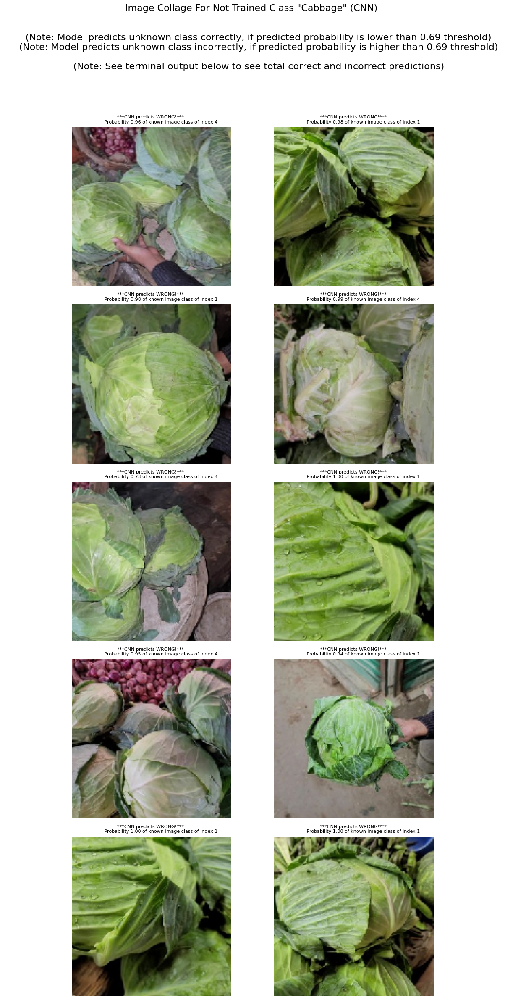

CNN model was correct 0/10 times at predicting an unknown image class
CNN model was incorrect 10/10 times at predicting an unknown image class


In [120]:
threshold = 0.69 # feel free to change
model_name = "CNN"
test_class = 'Not Trained Class "Cabbage"' # change not trained image class accordingly
test_images = predict_notrain('Food Drink Images Dataset/Not Trained (Cabbage)', model_CNN) # change directory path accordingly
plot_notrain_collage(test_images, test_class, model_name)

## VGG16 Model

1/1 [==============================] - 0s 35ms/step


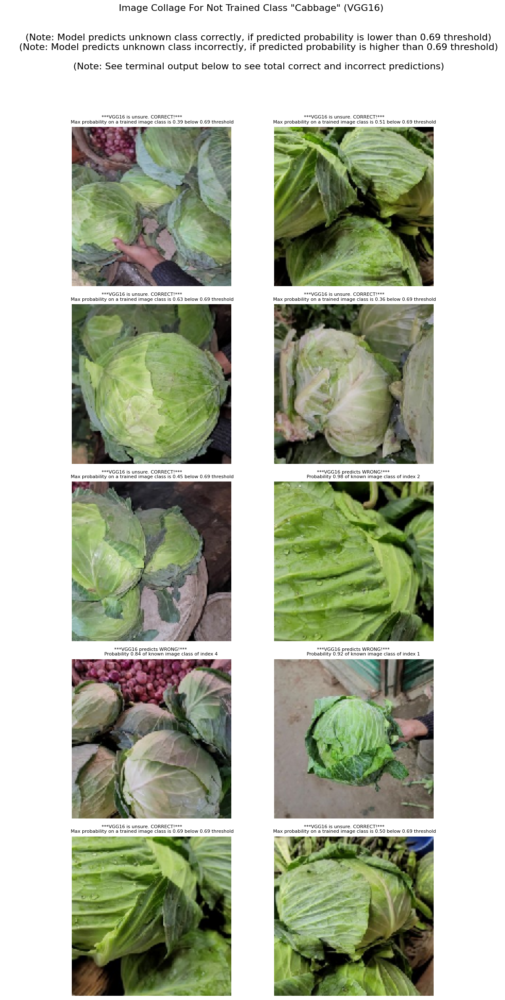

VGG16 model was correct 7/10 times at predicting an unknown image class
VGG16 model was incorrect 3/10 times at predicting an unknown image class


In [121]:
threshold = 0.69 # feel free to change
model_name = "VGG16"
test_class = 'Not Trained Class "Cabbage"' # change not trained image class accordingly
test_images = predict_notrain('Food Drink Images Dataset/Not Trained (Cabbage)', model_VGG16) # change directory path accordingly
plot_notrain_collage(test_images, test_class, model_name)

# *Appendix (EXTRAS WIP)

# 8.&nbsp;Manual Test (Upload Image)

### Upload Files Directly

Suitable for uploading files to Google's cloud and storing there TEMPORARILY without needing to mount Google Drive.

Warning: Files may be lost anytime after disconnecting from any Google runtime.

In [122]:
# from google.colab import files

# uploaded = files.upload()

# for fn in uploaded.keys():
#   print('User uploaded file "{name}" with length {length} bytes'.format(
#       name=fn, length=len(uploaded[fn])))

## Matplotlib Colormap

In [123]:
# import matplotlib.pyplot as plt

# def plot_colormaps():
#     colormaps = plt.colormaps()
#     n = len(colormaps)
#     fig, axs = plt.subplots(n, figsize=(4, 0.5*n), tight_layout=True)

#     for ax, cmap in zip(axs, colormaps):
#         gradient = np.linspace(0, 1, 256)
#         gradient = np.vstack((gradient, gradient))
#         ax.imshow(gradient, aspect='auto', cmap=plt.get_cmap(cmap))
#         ax.text(-0.01, 0.5, cmap, va='center', ha='right', fontsize=10, transform=ax.transAxes)
#         ax.set_axis_off()

# plot_colormaps()